# Ejemplo de segmentación con algoritmo Watershed

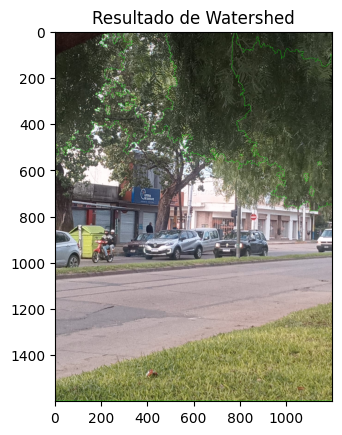

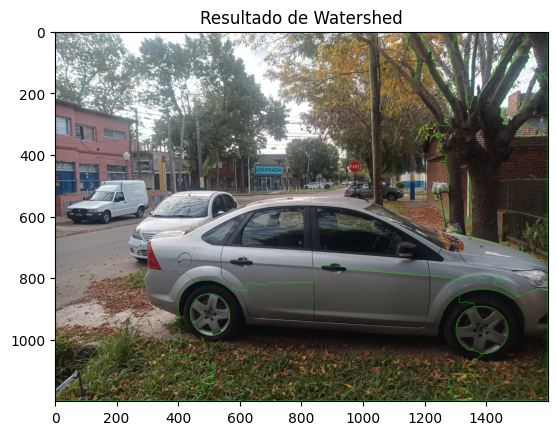

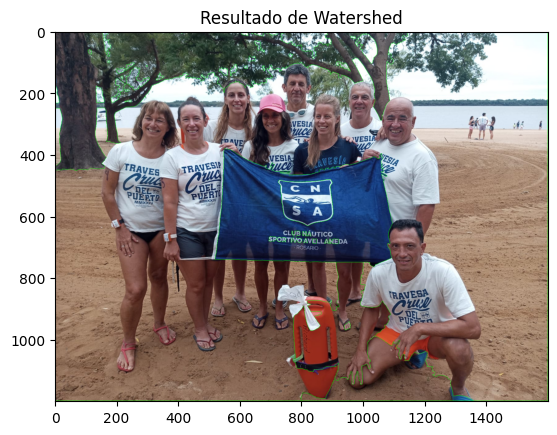

In [25]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

images = ['/content/Ejercicio9-Foto1.jpeg','/content/Ejercicio9-Foto3.jpeg','/content/Ejercicio9-Foto4.jpeg']

for image_path in images:
    img = cv2.imread(image_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (5, 5), 0)

    # Binarización de la imagen
    _, thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

    # Eliminación de ruido
    kernel = np.ones((3,3), np.uint8)
    opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=2)

    # Seguro fondo área
    sure_bg = cv2.dilate(opening, kernel, iterations=3)

    # Encontrar área segura del frente
    dist_transform = cv2.distanceTransform(opening, cv2.DIST_L2, 5)
    _, sure_fg = cv2.threshold(dist_transform, 0.7*dist_transform.max(), 255, 0)

    # Encontrar región desconocida
    sure_fg = np.uint8(sure_fg)
    unknown = cv2.subtract(sure_bg, sure_fg)

    # Etiquetado de marcadores
    _, markers = cv2.connectedComponents(sure_fg)

    # Añadir uno a todos los marcadores para asegurar que el fondo sea 1 en lugar de 0
    markers = markers+1

    # Marcar la región desconocida con cero
    markers[unknown==255] = 0

    # Aplicar el algoritmo Watershed
    markers = cv2.watershed(img, markers)
    img[markers == -1] = [0, 255, 0]

    # Visualizar el resultado
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('Resultado de Watershed')
    plt.show()


# Instance Segmentation con Mask R-CNN (OpenCV)

In [26]:
%%capture
!wget http://download.tensorflow.org/models/object_detection/mask_rcnn_inception_v2_coco_2018_01_28.tar.gz
!tar zxvf mask_rcnn_inception_v2_coco_2018_01_28.tar.gz
!wget https://raw.githubusercontent.com/spmallick/learnopencv/master/Mask-RCNN/mscoco_labels.names -O mscoco_labels.names
!wget https://raw.githubusercontent.com/spmallick/learnopencv/master/Mask-RCNN/colors.txt -O colors.txt
!wget https://raw.githubusercontent.com/spmallick/learnopencv/master/Mask-RCNN/mask_rcnn_inception_v2_coco_2018_01_28.pbtxt -O mask_rcnn_inception_v2_coco_2018_01_28.pbtxt

[INFO] Mask R-CNN tomó 9.050573 segundos en procesar la imagen
[INFO] Forma de boxes: (1, 1, 100, 7)
[INFO] Forma de masks: (100, 90, 15, 15)


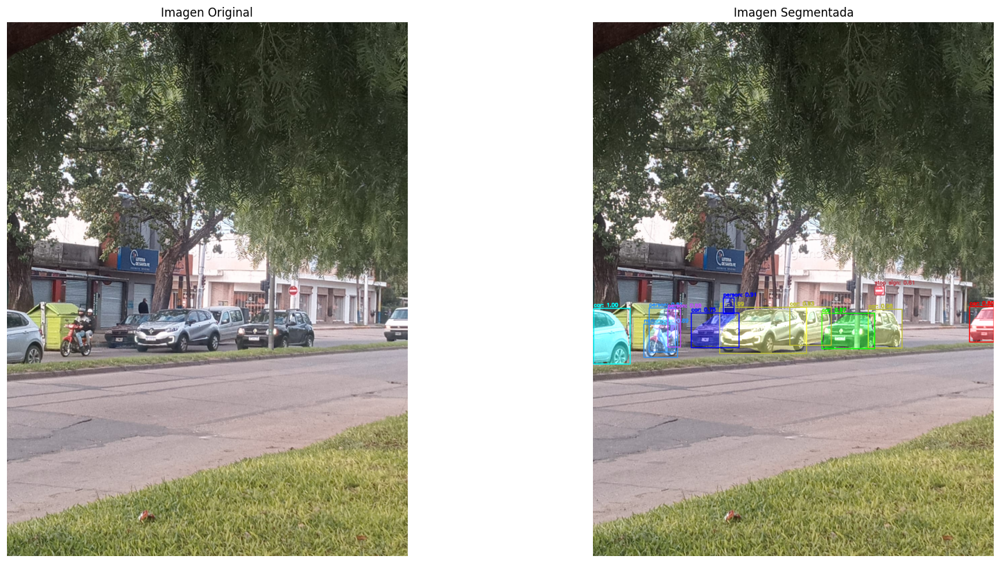

[INFO] Mask R-CNN tomó 7.881351 segundos en procesar la imagen
[INFO] Forma de boxes: (1, 1, 100, 7)
[INFO] Forma de masks: (100, 90, 15, 15)


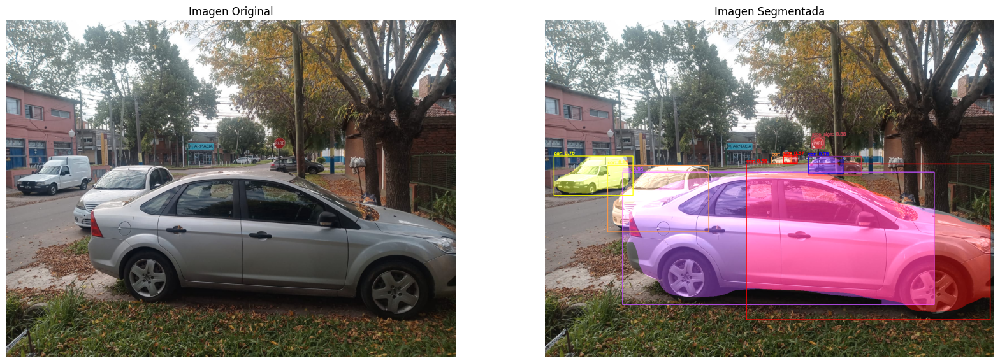

[INFO] Mask R-CNN tomó 7.463990 segundos en procesar la imagen
[INFO] Forma de boxes: (1, 1, 100, 7)
[INFO] Forma de masks: (100, 90, 15, 15)


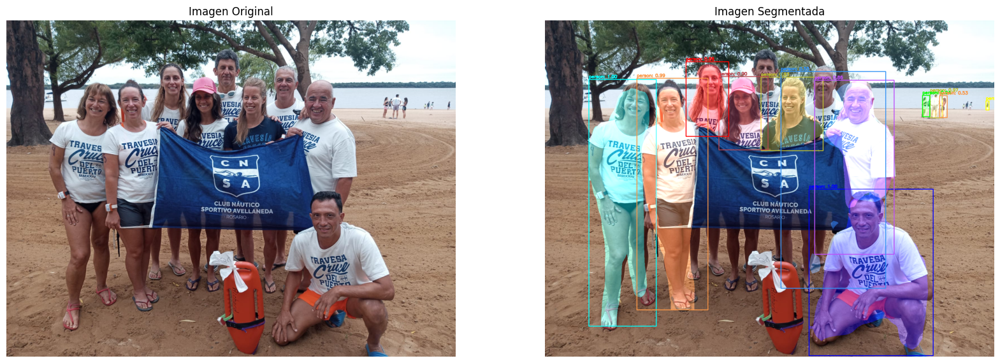

In [30]:
import numpy as np
import cv2 as cv
import time
import random
from matplotlib import pyplot as plt

# Umbral de confianza para las detecciones
confThreshold = 0.5
# Umbral para las máscaras de segmentación
maskThreshold = 0.3

# Cargar los nombres de las clases de MSCOCO
classesFile = "mscoco_labels.names"
classes = None
with open(classesFile, 'rt') as f:
    classes = f.read().rstrip('\n').split('\n')

# Cargar los colores para visualizar las detecciones
colorsFile = "colors.txt"
colors = []
with open(colorsFile, 'rt') as f:
    colorsStr = f.read().rstrip('\n').split('\n')
    for i in range(len(colorsStr)):
        rgb = colorsStr[i].split(' ')
        color = np.array([float(rgb[0]), float(rgb[1]), float(rgb[2])])
        colors.append(color)

# Archivos de configuración y pesos del modelo Mask R-CNN
textGraph = "./mask_rcnn_inception_v2_coco_2018_01_28.pbtxt"
modelWeights = "./mask_rcnn_inception_v2_coco_2018_01_28/frozen_inference_graph.pb"

# Cargar la red
net = cv.dnn.readNetFromTensorflow(modelWeights, textGraph)
net.setPreferableBackend(cv.dnn.DNN_BACKEND_OPENCV)
net.setPreferableTarget(cv.dnn.DNN_TARGET_CPU)

images = ['/content/Ejercicio9-Foto1.jpeg','/content/Ejercicio9-Foto3.jpeg','/content/Ejercicio9-Foto4.jpeg']

for image_path in images:

  # Cargar la imagen y obtener sus dimensiones

  image = cv.imread(image_path)
  (H, W) = image.shape[:2]

  # Crear un blob de la imagen y realizar una pasada hacia adelante con Mask R-CNN
  blob = cv.dnn.blobFromImage(image, swapRB=True, crop=False)
  net.setInput(blob)
  start = time.time()
  (boxes, masks) = net.forward(["detection_out_final", "detection_masks"])
  end = time.time()

  # Información de tiempo y formas de las detecciones y máscaras
  print("[INFO] Mask R-CNN tomó {:.6f} segundos en procesar la imagen".format(end - start))
  print("[INFO] Forma de boxes: {}".format(boxes.shape))
  print("[INFO] Forma de masks: {}".format(masks.shape))

  # Creamos una copia de la imagen original, para dibujar las máscaras
  output_image = image.copy()

  for i in range(0, boxes.shape[2]):
    confidence = boxes[0, 0, i, 2]
    if confidence > confThreshold:
        classId = int(boxes[0, 0, i, 1])
        box = boxes[0, 0, i, 3:7] * np.array([W, H, W, H])
        (startX, startY, endX, endY) = box.astype("int")

        # Redimensiona la máscara para que se ajuste a la caja delimitadora y la convierte en uint8
        mask = masks[i, classId]
        mask = cv.resize(mask, (endX - startX, endY - startY))
        mask = (mask > maskThreshold).astype("uint8")

        # Extrae la región de interés (ROI) usando las coordenadas de la caja delimitadora
        roi = output_image[startY:endY, startX:endX]

        # Crea una imagen de color sólido para la máscara
        color = random.choice(colors)
        color_mask = np.zeros_like(roi)
        color_mask[mask == 1] = color

        # Mezcla la imagen de color con la ROI utilizando la máscara
        roi = cv.addWeighted(roi, 1, color_mask, 0.4, 0)

        # Vuelve a colocar la ROI en la imagen original
        output_image[startY:endY, startX:endX] = roi

        # Dibuja la caja delimitadora
        cv.rectangle(output_image, (startX, startY), (endX, endY), color, 2)

        # Consigue el nombre de la clase y el color correspondiente
        classId = int(boxes[0, 0, i, 1])
        className = classes[classId]

        # Dibuja el rectángulo de la caja delimitadora y la etiqueta de la clase
        label = f"{className}: {confidence:.2f}"
        cv.rectangle(output_image, (startX, startY), (endX, endY), color, 2)
        cv.putText(output_image, label, (startX, startY - 5), cv.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)


  # Configurar los subplots
  fig, axes = plt.subplots(1, 2, figsize=(20, 10))

  # Mostrar la imagen original
  axes[0].imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB))
  axes[0].set_title('Imagen Original')
  axes[0].axis('off')  # Ocultar los ejes

  # Mostrar la imagen segmentada
  axes[1].imshow(cv.cvtColor(output_image, cv.COLOR_BGR2RGB))
  axes[1].set_title('Imagen Segmentada')
  axes[1].axis('off')  # Ocultar los ejes

  # Mostrar ambas imágenes
  plt.show()


# Instance Segmentation con modelo PointRend Resnet50 (PixelLib)

In [31]:
%%capture
!pip install pixellib torchvision
# Instance segmentation model
!wget "https://github.com/ayoolaolafenwa/PixelLib/releases/download/0.2.0/pointrend_resnet50.pkl" -O pointrend_resnet50.pkl

  proposal_generator.anchor_generator.cell_anchors.{0, 1, 2, 3, 4}
/usr/local/lib/python3.10/dist-packages/torch/functional.py:507: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3549.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


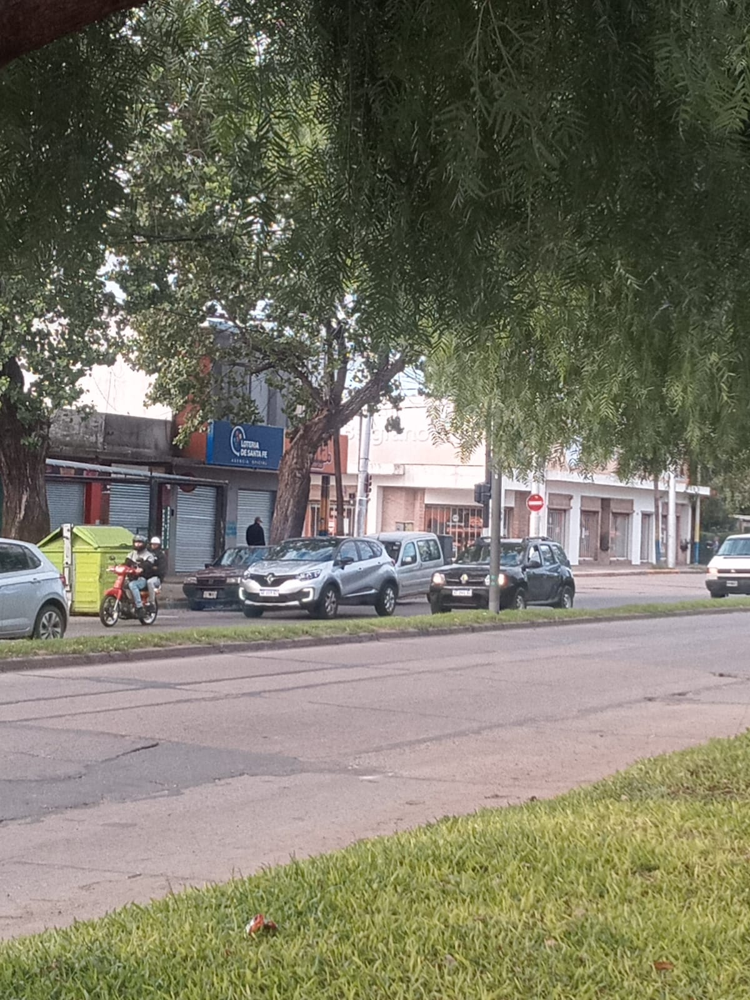

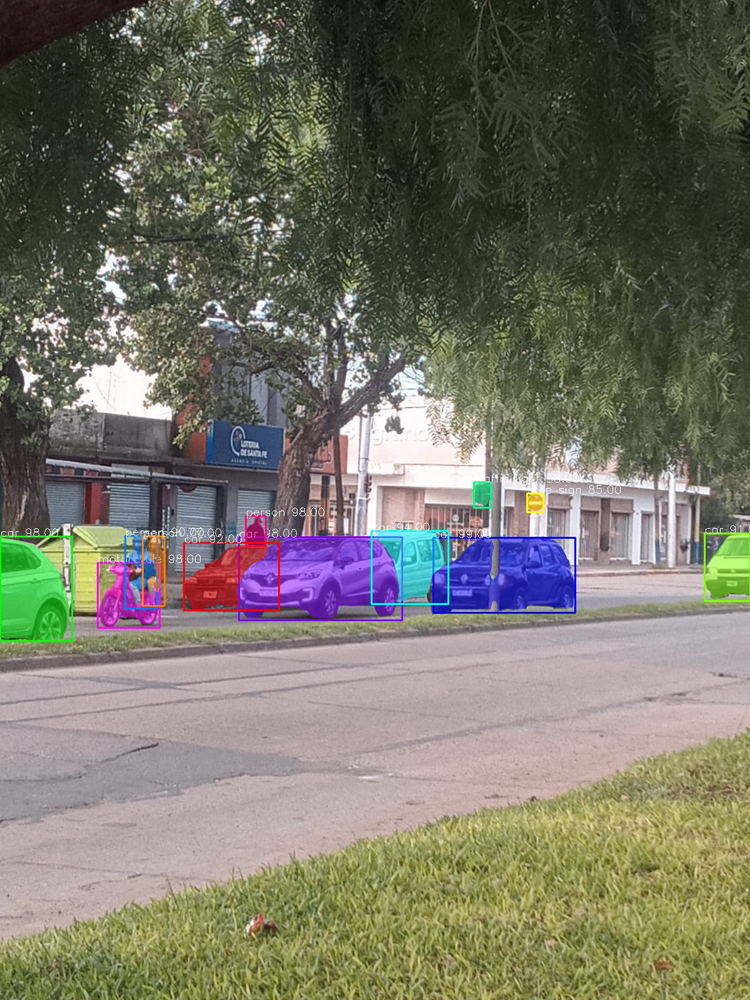

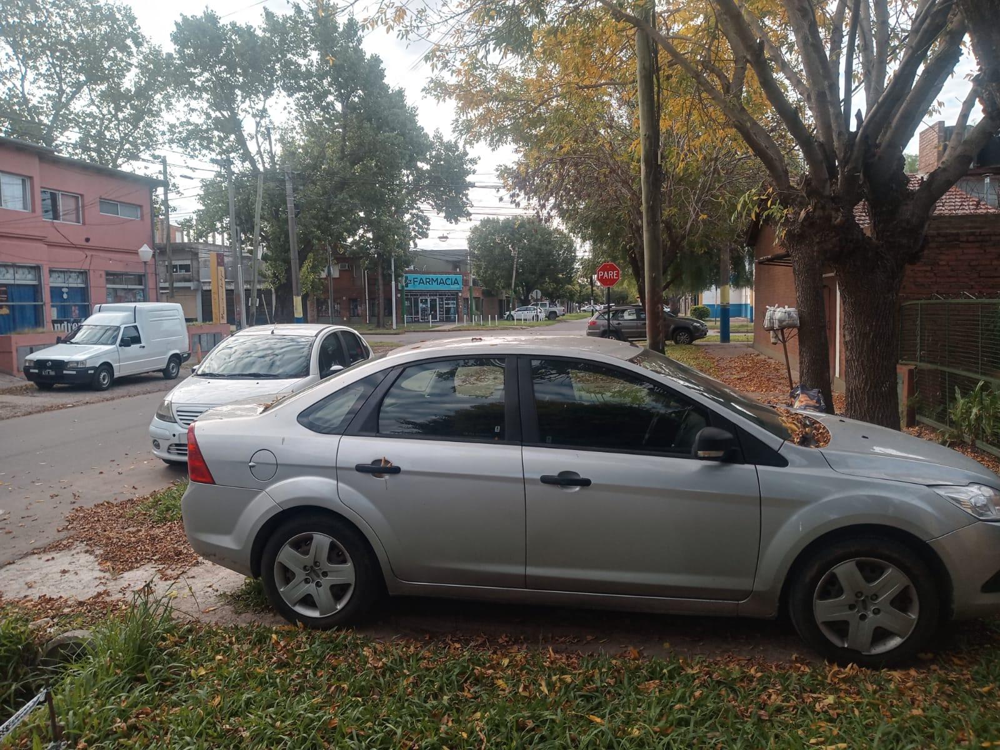

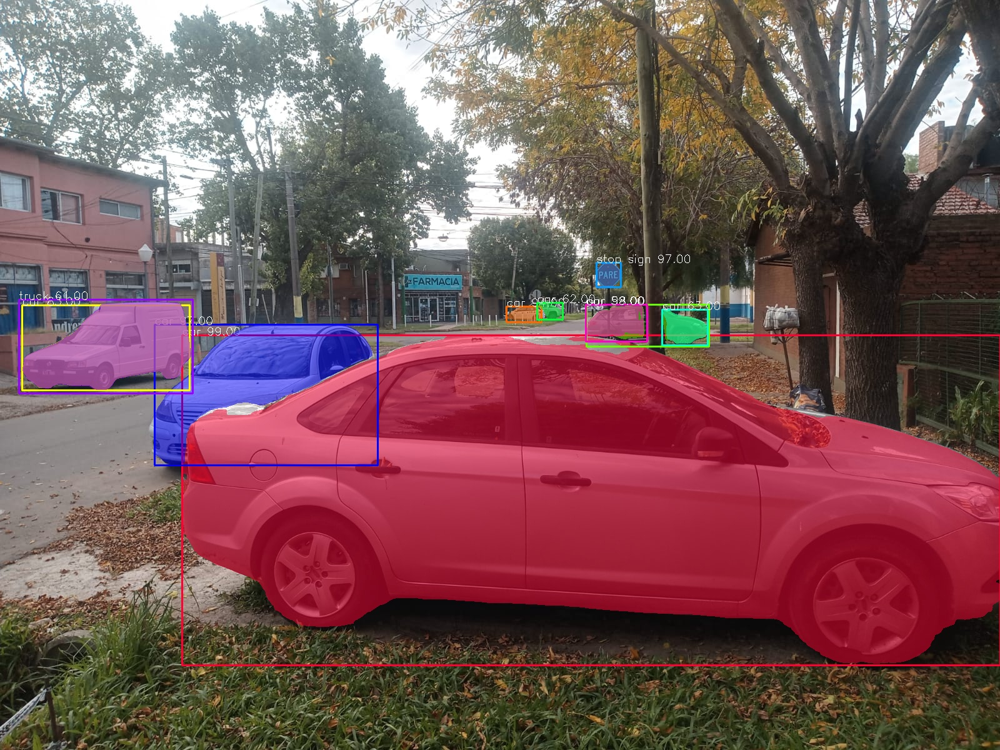

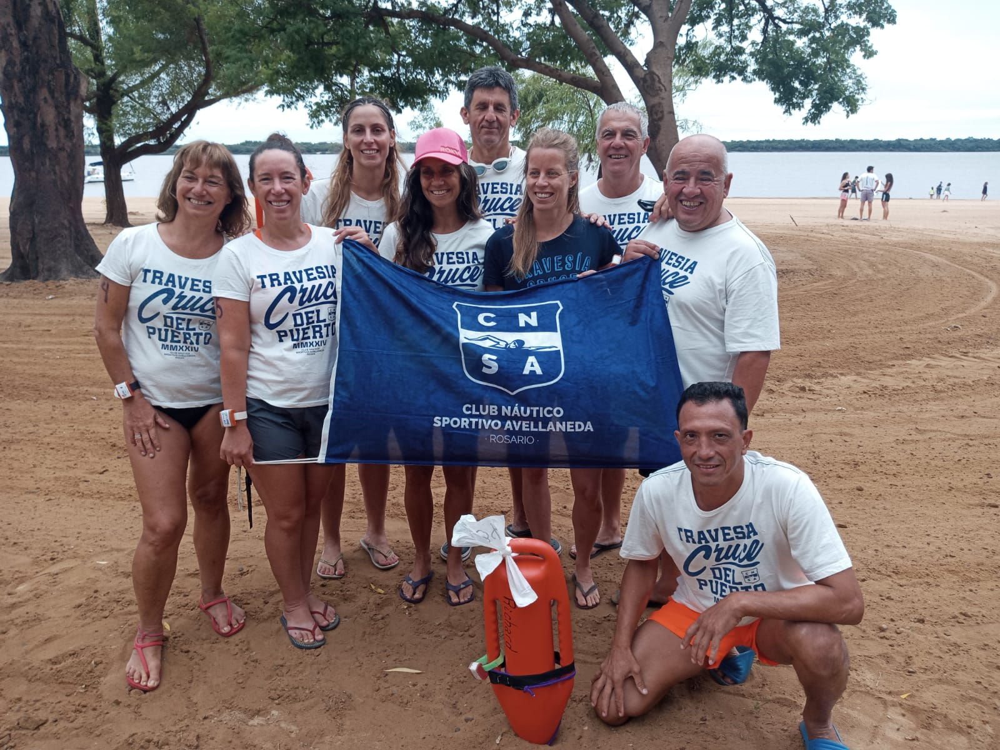

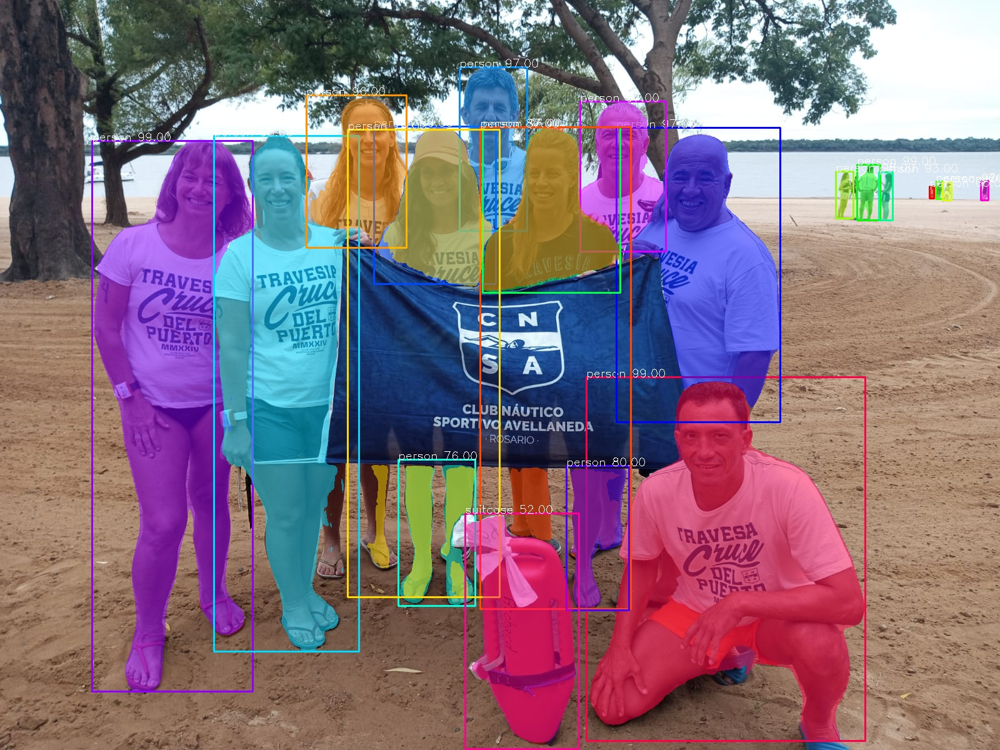

In [32]:
# Instalación de la biblioteca PixelLib
# !pip install pixellib

# Importación de las bibliotecas necesarias
import pixellib
from pixellib.torchbackend.instance import instanceSegmentation
from IPython.display import Image

# Creación de una instancia del modelo de segmentación
ins = instanceSegmentation()

# Carga del modelo preentrenado
ins.load_model("pointrend_resnet50.pkl")

for image_path in images:


  # Segmentación de la imagen y guardado de la imagen segmentada con las cajas delimitadoras
  nombre_salida = image_path[:-5] + "_segmented.jpeg"
  ins.segmentImage(image_path, show_bboxes=True, output_image_name= nombre_salida)

  # Muestra la imagen original
  display(Image(filename=image_path))

  # Muestra la imagen segmentada
  display(Image(filename=nombre_salida))

# Semantic Segmentation con modelo DeepLabV3 (Torchvision)

In [33]:
%%capture
!pip install torchvision
import torch
model = torch.hub.load('pytorch/vision:v0.10.0', 'deeplabv3_resnet50', pretrained=True)
model.eval()

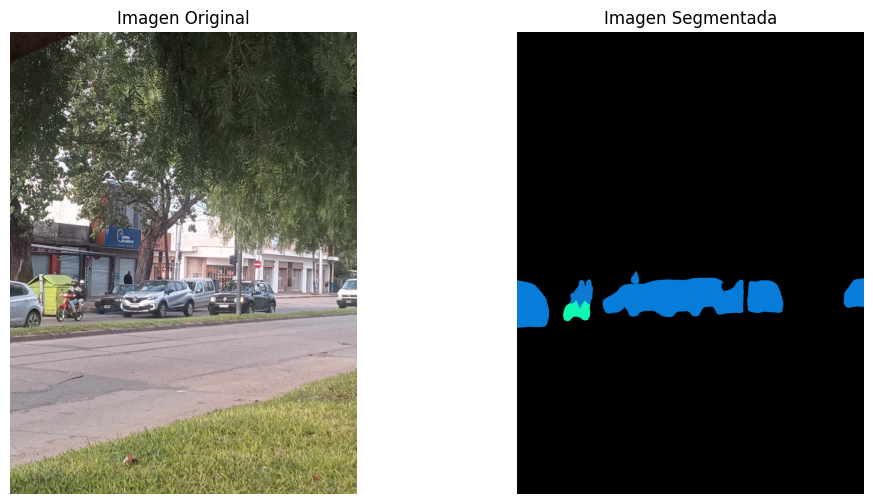

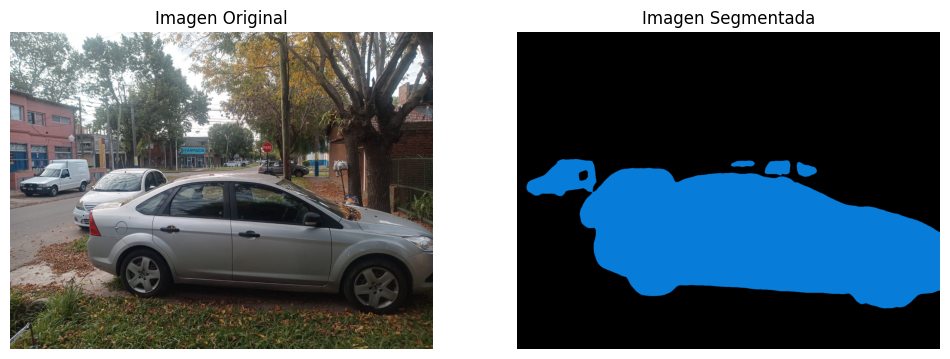

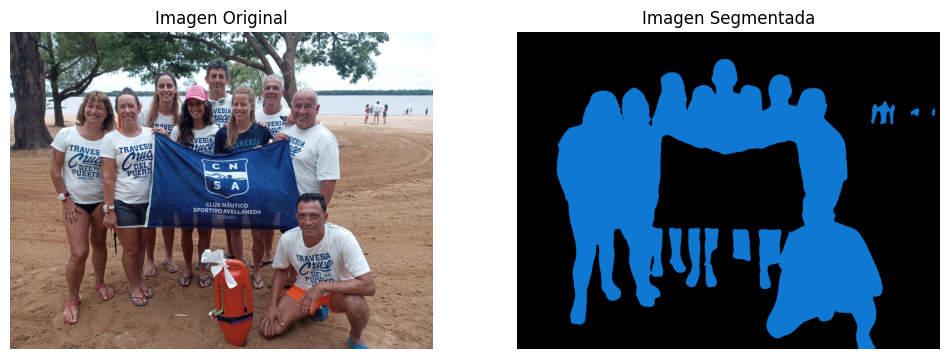

In [34]:
from PIL import Image
import matplotlib.pyplot as plt
from torchvision import transforms
import torch

for image_path in images:

  # Carga y procesa la imagen
  input_image = Image.open(image_path).convert("RGB").convert("RGB")

  preprocess = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
  ])

  input_tensor = preprocess(input_image)
  input_batch = input_tensor.unsqueeze(0)  # crea un mini-batch como espera el modelo

  # Mueve el input y el modelo a GPU para mayor velocidad si está disponible
  if torch.cuda.is_available():
    input_batch = input_batch.to('cuda')
    model.to('cuda')

  with torch.no_grad():
    output = model(input_batch)['out'][0]
  output_predictions = output.argmax(0)

  # Crea una paleta de colores, seleccionando un color para cada clase
  palette = torch.tensor([2 ** 25 - 1, 2 ** 15 - 1, 2 ** 21 - 1])
  colors = torch.as_tensor([i for i in range(21)])[:, None] * palette
  colors = (colors % 255).numpy().astype("uint8")

  # Genera la imagen de segmentación semántica
  r = Image.fromarray(output_predictions.byte().cpu().numpy()).resize(input_image.size)
  r.putpalette(colors)

  # Muestra la imagen original y la segmentada lado a lado
  plt.figure(figsize=(12, 6))
  plt.subplot(1, 2, 1)  # 1 fila, 2 columnas, primer subplot
  plt.imshow(input_image)
  plt.title('Imagen Original')
  plt.axis('off')  # Oculta los ejes

  plt.subplot(1, 2, 2)  # 1 fila, 2 columnas, segundo subplot
  plt.imshow(r)
  plt.title('Imagen Segmentada')
  plt.axis('off')  # Oculta los ejes

  plt.show()

# Instance Segmentation con PSPNet (MMSegmentation)
(Tengo error al ejecutarlo)

In [ ]:
#!pip install --upgrade pip

In [ ]:
#!pip install openmim --upgrade

In [ ]:
#!mim install mmengine
#!pip install mmcv>=2.0.0rc4
#!pip install "mmsegmentation>=1.0.0"

In [ ]:
#!mim download mmsegmentation --config pspnet_r50-d8_4xb2-40k_cityscapes-512x1024 --dest .

In [ ]:
#!git clone -b main https://github.com/open-mmlab/mmsegmentation.git

In [ ]:

# Instalación de librería MMSegmentation
#import sys
#!cd /content/mmsegmentation && {sys.executable} -m pip install -v -e .

In [ ]:
#import os
#os.kill(os.getpid(), 9)

In [ ]:
# os.chdir('/content/mmsegmentation')
# from mmseg.apis import inference_model, init_model, show_result_pyplot
# import mmcv
# import matplotlib.pyplot as plt
# import numpy as np

# # Configuración e inicialización del modelo
# config_file = '../pspnet_r50-d8_4xb2-40k_cityscapes-512x1024.py'
# checkpoint_file = '../pspnet_r50-d8_512x1024_40k_cityscapes_20200605_003338-2966598c.pth'
# model = init_model(config_file, checkpoint_file, device='cuda:0')

# for image_path in images:

#   # Inferencia del modelo
#   result = inference_model(model, image_path)

#   # display the segmentation result
#   segmented_image = show_result_pyplot(model, img_path, result)

#   # Visualización con matplotlib
#   plt.figure(figsize=(10, 5))
#   plt.imshow(segmented_image)
#   plt.axis('off')  # Oculta los ejes
#   plt.show()

# Instance Segmentation con YoloV8 (Ultralytics)

In [35]:
%%capture
!pip install ultralytics==8.0.196

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

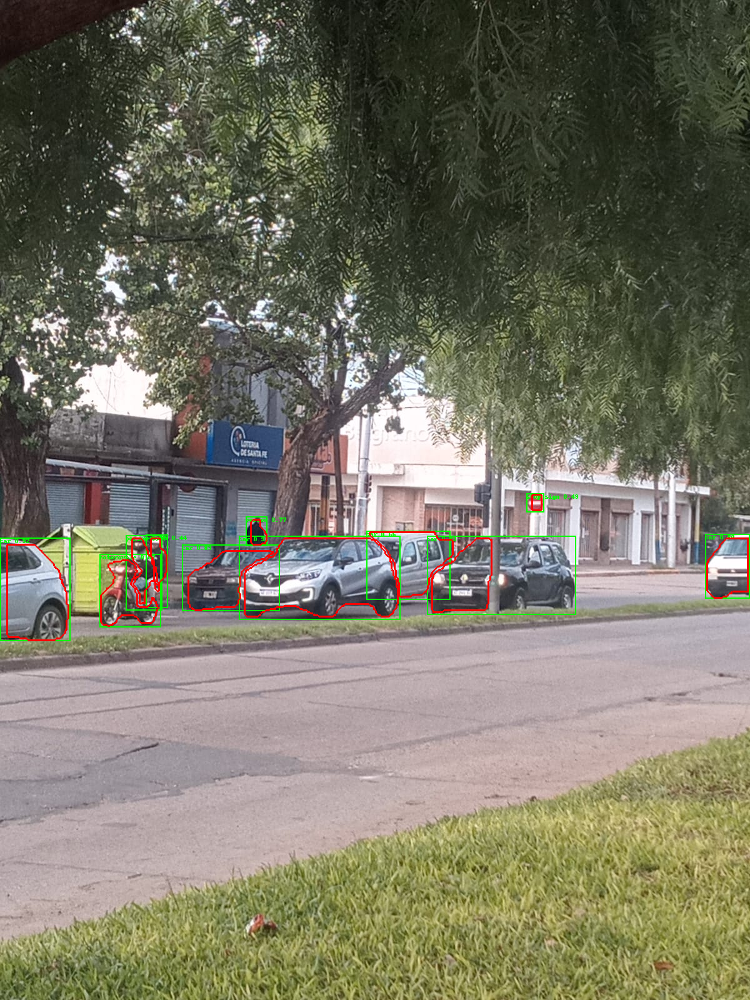

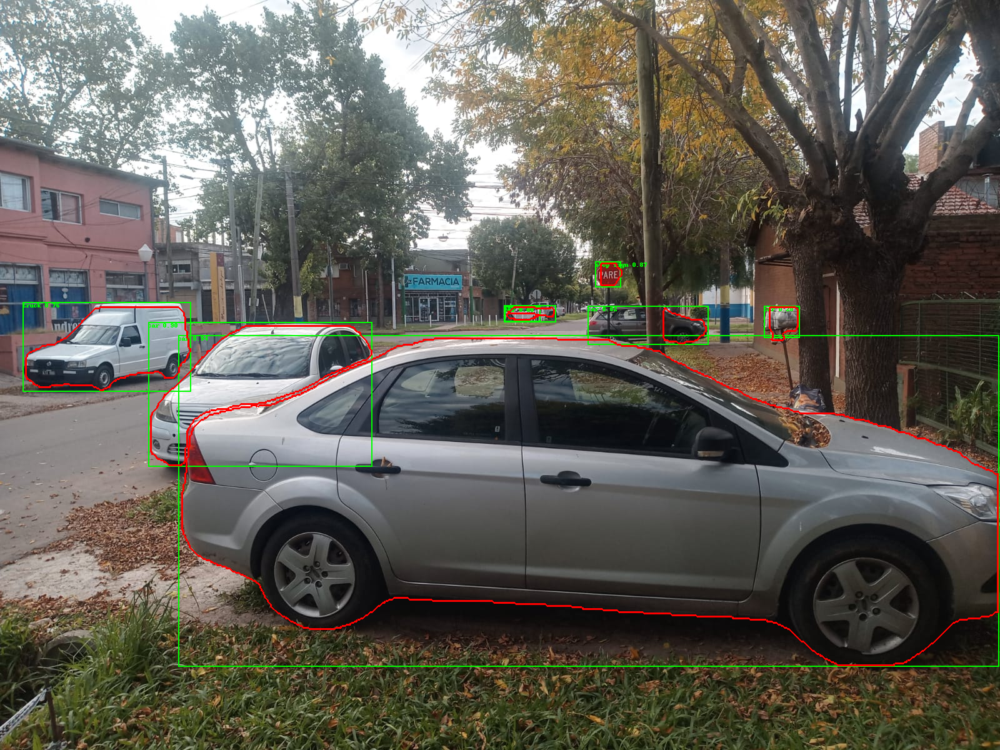

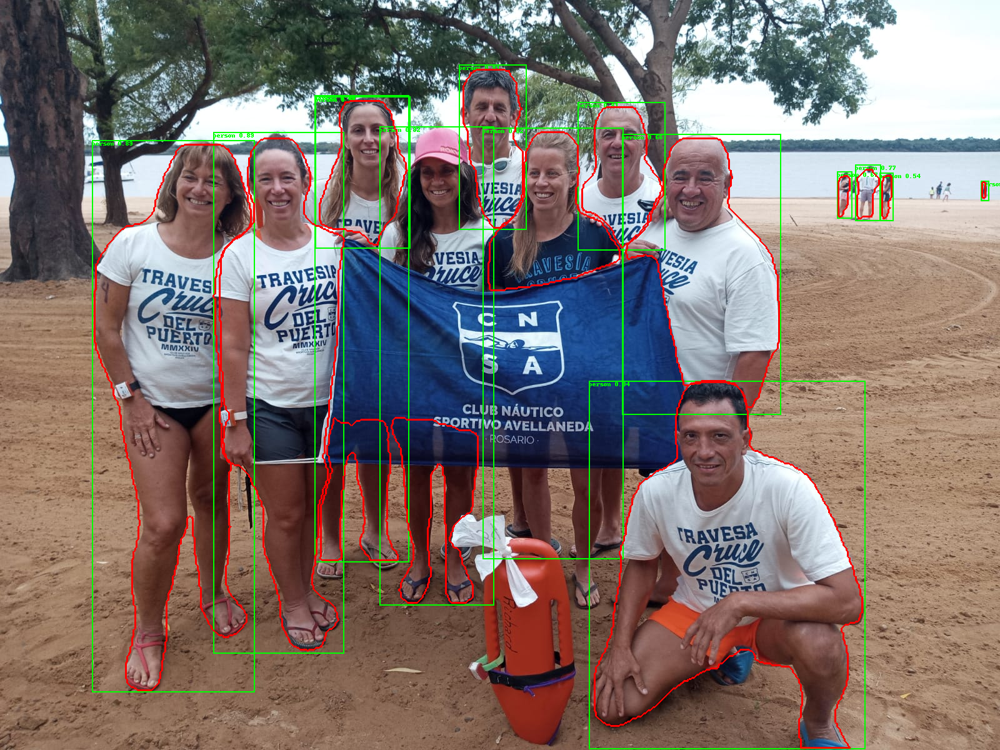

In [36]:
from ultralytics import YOLO
from PIL import Image, ImageDraw
import numpy as np
from IPython.display import display

# Cargar el modelo YOLOv8 con capacidad de segmentación
model = YOLO("yolov8m-seg.pt")

images = ['/content/Ejercicio9-Foto1.jpeg', '/content/Ejercicio9-Foto3.jpeg','/content/Ejercicio9-Foto4.jpeg']

for image_path in images:


  # Realizar predicciones en la imagen
  results = model.predict(image_path)

  # Seleccionar el primer resultado (en caso de que haya varios)
  result = results[0]


  # Abrir la imagen original para dibujar sobre ella
  img = Image.open(image_path)
  draw = ImageDraw.Draw(img)

  # Para cada detección, dibujar el bounding box y mostrar la clase
  for box in results[0].boxes:
    # Extracción de coordenadas del bounding box y clase
    x1, y1, x2, y2, conf, cls = box.data[0]
    label = result.names[int(cls)]  # Asumiendo que result.names contiene los nombres de las clases

    # Dibujar el bounding box
    draw.rectangle([x1, y1, x2, y2], outline=(0, 255, 0), width=2)

    # Mostrar la clase (y opcionalmente la confianza) en el bounding box
    text = f"{label} {conf:.2f}"
    draw.text((x1, y1), text, fill=(0, 255, 0))

  # Acceder a las máscaras del resultado
  masks = result.masks

  # Iterar a través de todas las máscaras encontradas
  for mask in masks:
    # Convertir la máscara a un array numpy y obtener el polígono
    mask_data = mask.data[0].numpy()
    polygon = mask.xy[0]

    # Dibujar el polígono correspondiente a cada máscara en la imagen original
    polygon_list = [(p[0], p[1]) for p in polygon]
    draw.polygon(polygon_list, outline=(255, 0, 0), width=3)

  # Mostrar la imagen con los polígonos dibujados
  display(img)

# Panoptic segmentation con modelo DETR ResNet50 (Transformers)

In [ ]:
#%%capture
#!pip install timm

In [ ]:
# import io
# import requests
# from PIL import Image, ImageDraw, ImageFont
# import torch
# import numpy as np
# import matplotlib.pyplot as plt
# import itertools
# import seaborn as sns
# from transformers import DetrFeatureExtractor, DetrForSegmentation
# from transformers.models.detr.feature_extraction_detr import rgb_to_id

# for image_path in images:

#   image = Image.open(image_path)

#   # Cargar el modelo y el extractor de características
#   feature_extractor = DetrFeatureExtractor.from_pretrained("facebook/detr-resnet-50-panoptic")
#   model = DetrForSegmentation.from_pretrained("facebook/detr-resnet-50-panoptic")

#   # Preparar la imagen para el modelo
#   inputs = feature_extractor(images=image, return_tensors="pt")

#   # Paso forward
#   outputs = model(**inputs)

#   # Postprocesamiento
#   processed_sizes = torch.as_tensor(inputs["pixel_values"].shape[-2:]).unsqueeze(0)
#   result = feature_extractor.post_process_panoptic(outputs, processed_sizes, threshold=0.85)[0]

#   # Convertir la segmentación a numpy
#   panoptic_seg = Image.open(io.BytesIO(result["png_string"]))
#   panoptic_seg = np.array(panoptic_seg, dtype=np.uint8)
#   panoptic_seg_id = rgb_to_id(panoptic_seg)

#   # Preparar la paleta de colores
#   palette = itertools.cycle(sns.color_palette())

#   # Crear la imagen segmentada
#   segmented_image = Image.fromarray(np.zeros_like(panoptic_seg, dtype=np.uint8))
#   draw = ImageDraw.Draw(segmented_image)

#   # Añadimos un mapeo manual de los IDs de las categorías a los nombres, basado en las clases comunes de COCO
#   COCO_LABELS = {
#     1: 'persona', 2: 'bicicleta', 3: 'coche', 4: 'motocicleta', 5: 'avión',
#     6: 'autobús', 7: 'tren', 8: 'camión', 9: 'barco', 10: 'semáforo',
#     11: 'hidrante', 13: 'señal de stop', 14: 'parquímetro', 15: 'banco', 16: 'pájaro',
#     17: 'gato', 18: 'perro', 19: 'caballo', 20: 'oveja', 21: 'vaca',
#     22: 'elefante', 23: 'oso', 24: 'cebra', 25: 'jirafa', 27: 'mochila',
#     28: 'paraguas', 31: 'bolso de mano', 32: 'corbata', 33: 'maleta', 34: 'frisbee',
#     36: 'tabla de snowboard', 37: 'pelota deportiva', 38: 'cometa', 39: 'bate de béisbol',
#     40: 'guante de béisbol', 41: 'patineta', 42: 'tabla de surf', 43: 'raqueta de tenis',
#     44: 'botella', 46: 'plato de vino', 47: 'taza', 48: 'tenedor', 49: 'cuchillo',
#     50: 'cuchara', 51: 'tazón', 52: 'banana', 53: 'manzana', 54: 'sándwich',
#     55: 'naranja', 56: 'brócoli', 57: 'zanahoria', 58: 'perrito caliente', 59: 'pizza',
#     60: 'donut', 61: 'pastel', 62: 'silla', 63: 'sofá', 64: 'maceta', 65: 'cama',
#     67: 'mesa de comedor', 70: 'inodoro', 72: 'TV', 73: 'computadora portátil', 74: 'ratón',
#     75: 'control remoto', 76: 'teclado', 77: 'teléfono celular', 78: 'microondas',
#     79: 'horno', 80: 'tostadora', 81: 'fregadero', 82: 'refrigerador', 84: 'libro',
#     85: 'reloj', 86: 'florero', 87: 'tijeras', 88: 'oso de peluche', 89: 'secador de pelo',
#     90: 'cepillo de dientes',
#   }

#   # Ajusta el bucle para dibujar segmentos y etiquetas correctamente
#   for segment_info in result["segments_info"]:
#     class_id = segment_info["category_id"]
#     class_name = COCO_LABELS.get(class_id, 'Desconocido')  # 'Desconocido' si el ID no está en el diccionario
#     id = segment_info["id"]

#     # Generar la máscara para este segmento específico
#     mask = panoptic_seg_id == id
#     color = np.array(next(palette)) * 255  # Convertir el color a un array de numpy adecuado

#     # Convertir la máscara a una imagen de PIL para usarla como máscara en 'paste'
#     mask_image = Image.fromarray((mask * 255).astype(np.uint8))

#     # Crear una imagen del color del segmento que tenga las dimensiones correctas
#     color_image = Image.new("RGB", segmented_image.size, color=tuple(color.astype(int)))

#     # Pegar usando la máscara para aplicar solo este segmento
#     segmented_image.paste(color_image, (0,0), mask=mask_image)

#     # Dibujar el nombre de la clase en la posición inicial del segmento
#     draw = ImageDraw.Draw(segmented_image)
#     where = np.where(mask)
#     if where[0].size > 0 and where[1].size > 0:
#         x, y = np.min(where[1]), np.min(where[0])
#         draw.text((x, y), class_name, fill='white')

#   # Mostrar la imagen original y la segmentada
#   plt.figure(figsize=(30, 15))
#   plt.subplot(1, 2, 1)
#   plt.imshow(image)
#   plt.title('Imagen Original')
#   plt.axis('off')

#   plt.subplot(1, 2, 2)
#   plt.imshow(segmented_image)
#   plt.title('Imagen Segmentada con Etiquetas')
#   plt.axis('off')

#   plt.show()
